In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import optuna

import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
color_pal = sns.color_palette()
pd.options.plotting.backend = "plotly"
plt.style.use('fivethirtyeight')

c:\Mastère OSE\Machine_Learning\MLenv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
Load = pd.read_csv("./data_input/Load.csv",sep=';')
Load.index = pd.to_datetime(Load['DateTime'],format='%d/%m/%Y %H:%M:%S.%f').dt.round('H')
Load.drop(['DateTime'],axis=1,inplace=True)
Load.sort_index(inplace=True)
Load_dict = {}
Load_dict['FR'] = Load[['FR']].copy()

In [3]:
TA = pd.read_csv("./data_input/TA_tab.csv")
TA.index = pd.to_datetime(TA[['Year','Month','Day']])
TA = TA.resample('h').ffill()
TA.drop(['Year','Month','Day'],axis=1,inplace=True)

In [4]:
JF = pd.read_csv('./data_input/jours_feries_metropole.csv')
JF.index = pd.to_datetime(JF['date'])
TA['Férié'] = 0
TA.loc[:,'Férié'].loc[JF.loc[(JF.index>='2014')&(JF.index<'2020-01-01')].index] = 1

C:\Users\Beaucour\AppData\Local\Temp\ipykernel_20508\36948917.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  TA.loc[:,'Férié'].loc[JF.loc[(JF.index>='2014')&(JF.index<'2020-01-01')].index] = 1


In [9]:
correlation = pd.concat([Load[['FR']].copy().loc[(Load[['FR']].index >='2015')&(Load[['FR']].index <'2020')],TA.copy().loc[(TA.index >='2015')&(TA.index <'2020')]],axis=1).corr()

In [10]:
q = np.abs(correlation[['FR']])
q.nlargest(10,'FR')

,FR
FR,1.000000
ITC4,0.789307
ITH2,0.789079
ITH1,0.787501
ITH4,0.787022
DE27,0.786647
ITC1,0.786626
AT21,0.786171
CH05,0.786077
ITH3,0.786007


In [12]:
def Temp_pays(df,pays):
    """_summary_

    Args:
        df (_type_): _description_
        pays (_type_): _description_

    Returns:
        _type_: _description_
    """
    list_col = []
    for col in df.columns:
        if col.startswith(pays):
            list_col.append(col)
    return list_col

In [13]:
pca = PCA(n_components=2)
pca.fit(TA[Temp_pays(TA,'FR')])
PCA_features = pd.DataFrame(pca.transform(TA[Temp_pays(TA,'FR')]),columns=['PCA1','PCA2'],index=TA.index)
PCA_features

,PCA1,PCA2
2014-01-01 00:00:00,32.554927,-2.355910
2014-01-01 01:00:00,32.554927,-2.355910
2014-01-01 02:00:00,32.554927,-2.355910
2014-01-01 03:00:00,32.554927,-2.355910
2014-01-01 04:00:00,32.554927,-2.355910
...,...,...
2020-04-29 20:00:00,-0.721553,1.548798
2020-04-29 21:00:00,-0.721553,1.548798
2020-04-29 22:00:00,-0.721553,1.548798
2020-04-29 23:00:00,-0.721553,1.548798


In [14]:
train = pd.concat([Load_dict['FR'].loc[(Load_dict['FR'].index < '01-01-2019')&(Load_dict['FR'].index >= '01-01-2015')],
TA.loc[(TA.index < '01-01-2019')&(TA.index >= '01-01-2015')],
PCA_features.loc[(PCA_features.index < '01-01-2019')&(PCA_features.index >= '01-01-2015')]],
axis=1)
test = pd.concat([Load_dict['FR'].loc[(Load_dict['FR'].index > '01-01-2019')&(Load_dict['FR'].index < '2020')],
TA.loc[(TA.index > '01-01-2019')&(TA.index < '2020')],
PCA_features.loc[(PCA_features.index > '01-01-2019')&(PCA_features.index < '2020')
]],axis=1)

In [15]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x = train.index,
        y = train['FR'],
        name = 'train'
    )
)
fig.add_trace(
    go.Scatter(
        x = test.index,
        y = test['FR'],
        name = 'test'
    )
)

In [16]:
def create_features(df):
    """
    This function takes in a dataframe and returns a modified dataframe with additional features.
    The added features include: hour, day of week, quarter, month, year, day of year, day of month, and week of year.

    Args:
    df (pandas.DataFrame): The input dataframe.

    Returns:
        pandas.DataFrame: The modified dataframe with additional features.
    """
    df = df.copy()
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week
    return df

In [17]:
train = create_features(train)
test = create_features(test)

FEATURES = ['dayofyear', 'hour', 'dayofweek', 'quarter', 'month', 'year','Férié'] + ['PCA1','PCA2']
TARGET = 'FR'

X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [72]:
X_train.shape

(35064, 9)

In [18]:
reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1500,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=15,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[12:33:15] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-030221e36e1a46bfb-1/xgboost/xgboost-ci-windows/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:54785.97620	validation_1-rmse:54013.26117
[100]	validation_0-rmse:20291.31800	validation_1-rmse:20092.06784
[200]	validation_0-rmse:7673.24546	validation_1-rmse:7983.04368
[300]	validation_0-rmse:3028.62814	validation_1-rmse:4082.60575
[400]	validation_0-rmse:1292.81740	validation_1-rmse:3142.70089
[500]	validation_0-rmse:624.56565	validation_1-rmse:2993.54836
[600]	validation_0-rmse:356.43459	validation_1-rmse:2949.31153
[700]	validation_0-rmse:239.90393	validation_1-rmse:2941.23574
[800]	validation_0-rmse:185.33922	validation_1-rmse:2939.54413
[900]	validation_0-rmse:152.24488	validation_1-rmse:2938.37655
[1000]	validation_0-rmse:128.90421	validation_1-rmse:2937.71245
[1100]	validation_0-rmse:111.24744	validation_1-rmse:2937.33832
[120

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=50, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.01, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=15, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1500, n_jobs=0,
             num_parallel_tree=1, objective='reg:linear', predictor='auto', ...)

In [64]:
def features_importance(model,return_='show'):
    fig = go.Figure()
    dd = pd.DataFrame(data=model.feature_importances_,index=model.feature_names_in_,columns=['importance']).sort_values(by='importance',ascending=False)
    fig.add_trace(
        go.Bar(
            x = dd.index,
            y = dd['importance']*100
        )
    )
    fig.update_layout(
        title = 'Importance of features',
        yaxis_title="%"
    )
    assert return_ in ['fig','show'], "return_ must be 'fig' or 'show'"
    if return_=='show':
        fig.show()
    if return_ == 'fig':
        return fig

In [34]:
test['prediction'] = reg.predict(X_test)
Load_dict['FR'] = Load_dict['FR'].merge(test[['prediction']], how='left', left_index=True, right_index=True)
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x = Load_dict['FR'].index,
        y = Load_dict['FR'].FR,
        name = 'Truth Data'
    )
)
fig.add_trace(
    go.Scatter(
        x = Load_dict['FR'].index,
        y = Load_dict['FR'].prediction,
        name = 'Prediction'
    )
)
fig.update_layout(
    title = f"RMSE for 2019 forecast : {np.round(np.sqrt(mean_squared_error(test.FR,test.prediction)),2)}",
    hovermode='x'
)

## OPTUNA

In [38]:
study = optuna.create_study(direction='minimize', study_name="starter-experiment")

[I 2022-12-25 12:46:47,000] A new study created in memory with name: starter-experiment


In [39]:
def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2)
    n_estimators = trial.suggest_int('n_estimators', 700, 1500)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    
    # Create an XGBRegressor model with the sampled hyperparameters
    model = xgb.XGBRegressor(learning_rate=learning_rate, n_estimators=n_estimators,max_depth=max_depth)
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Calculate the mean squared error on the validation set
    mse = mean_squared_error(y_test, model.predict(X_test))
    
    # Return the negative MSE to minimize the objective
    return mse


In [57]:
def objective(trial):
    params = {
        'learning_rate' : trial.suggest_float('learning_rate', 1e-5, 1e-2),
        'n_estimators' : trial.suggest_int('n_estimators', 700, 1500),
        'max_depth' : trial.suggest_int('max_depth', 3, 20)
    }

    # Create an XGBRegressor model with the sampled hyperparameters
    model = xgb.XGBRegressor(**params)
    
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Calculate the mean squared error on the validation set
    mse = mean_squared_error(y_test, model.predict(X_test))
    
    # Return the negative MSE to minimize the objective
    return mse


In [58]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)

[I 2022-12-25 14:06:08,745] A new study created in memory with name: no-name-07cac3c5-8e39-46c0-932e-ee3eebe166e2
[I 2022-12-25 14:06:14,914] Trial 0 finished with value: 9680291.732264927 and parameters: {'learning_rate': 0.003324496964916149, 'n_estimators': 1442, 'max_depth': 5}. Best is trial 0 with value: 9680291.732264927.
[I 2022-12-25 14:06:19,106] Trial 1 finished with value: 277760658.3991195 and parameters: {'learning_rate': 0.0012329356861011168, 'n_estimators': 987, 'max_depth': 5}. Best is trial 0 with value: 9680291.732264927.
[I 2022-12-25 14:06:27,453] Trial 2 finished with value: 671145313.5516309 and parameters: {'learning_rate': 0.0007586374849298567, 'n_estimators': 993, 'max_depth': 10}. Best is trial 0 with value: 9680291.732264927.
[I 2022-12-25 14:06:42,682] Trial 3 finished with value: 9027590.643002145 and parameters: {'learning_rate': 0.003972063269840762, 'n_estimators': 1097, 'max_depth': 11}. Best is trial 3 with value: 9027590.643002145.
[I 2022-12-25 14

In [41]:
best_params = study.best_params

# Create a final XGBRegressor model using the best hyperparameters
model = xgb.XGBRegressor(
    learning_rate=best_params['learning_rate'],
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'])

# Fit the model on the full dataset
model.fit(X_train, y_train)

# Evaluate the model on the test set
test_mse = np.sqrt(mean_squared_error(y_test, model.predict(X_test)))
print(f'Test MSE: {test_mse:.3f}')


Test MSE: 2788.057


In [42]:
print(best_params)

{'learning_rate': 0.008386919160150446, 'n_estimators': 1159, 'max_depth': 7}


In [45]:
test['prediction'] = model.predict(X_test)
Load_dict['FR'] = Load_dict['FR'].merge(test[['prediction']], how='left', left_index=True, right_index=True)

In [46]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x = Load_dict['FR'].index,
        y = Load_dict['FR'].FR,
        name = 'Truth Data'
    )
)
fig.add_trace(
    go.Scatter(
        x = Load_dict['FR'].index,
        y = Load_dict['FR'].prediction,
        name = 'Prediction'
    )
)
fig.update_layout(
    title = f"RMSE for 2019 forecast : {np.round(np.sqrt(mean_squared_error(test.FR,test.prediction)),2)}",
    hovermode='x'
)

Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.


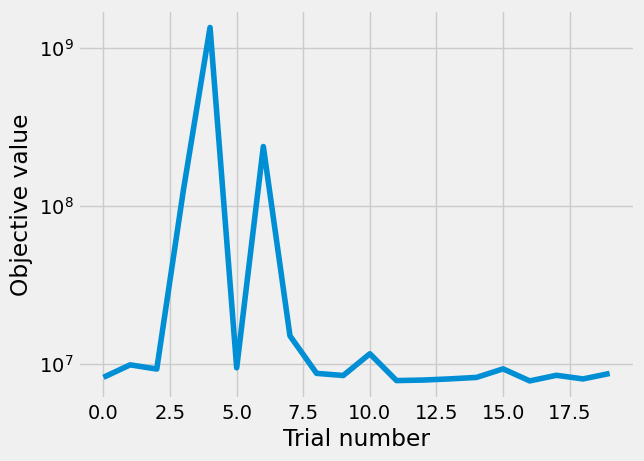

In [48]:
import matplotlib.pyplot as plt

df = study.trials_dataframe()

# Plot the objective value (mean squared error) for each trial
plt.plot(df['value'])
plt.xlabel('Trial number')
plt.ylabel('Objective value')
plt.yscale("log") 
plt.show()


In [53]:
fig = optuna.visualization.plot_optimization_history(study)
fig.update_yaxes(type="log")
fig.show()

In [54]:
optuna.visualization.plot_param_importances(study)


In [55]:
optuna.visualization.plot_slice(study)

Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
